In [18]:
import warnings
warnings.filterwarnings('ignore')
import os, sys, random
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import pickle
from tqdm import tqdm, trange
import torch
import torch.nn as nn
import torch.nn.functional as F
from torch.utils.data import DataLoader, TensorDataset
from transformers import BertTokenizerFast, BertModel
from sklearn.metrics import (
    roc_auc_score, roc_curve, precision_recall_curve,
    average_precision_score, brier_score_loss
)
from sklearn.calibration import calibration_curve
from scipy import stats
def shannon_entropy(p, epsilon=1e-10):
    p = np.clip(p, epsilon, 1 - epsilon)
    return -p * np.log(p) - (1 - p) * np.log(1 - p)
def compute_ece(y_true, y_prob, n_bins=10):
    y_true, y_prob = np.array(y_true), np.array(y_prob)
    bin_edges = np.linspace(0, 1, n_bins + 1)
    ece = 0.0
    for i in range(n_bins):
        bin_lower = bin_edges[i]
        bin_upper = bin_edges[i + 1]
        bin_mask = (y_prob > bin_lower) & (y_prob <= bin_upper)
        if np.sum(bin_mask) > 0:
            bin_accuracy = np.mean(y_true[bin_mask] == 1)
            bin_confidence = np.mean(y_prob[bin_mask])
            ece += np.abs(bin_accuracy - bin_confidence) * (np.sum(bin_mask) / len(y_true))
    return ece
def uncertainty_auroc(y, predictions, variance):
    y = np.array(y)
    predictions = np.array(predictions)
    variance = np.array(variance)
    correctness = (y == (predictions > 0.5))
    fprs, tprs, _ = roc_curve(correctness, -variance)
    auc = roc_auc_score(correctness, -variance)
    return tprs, fprs, auc
def calculate_ause(uncertainty, predictions, targets, metric='brier',
                   bins=10, min_fraction=0.0, max_fraction=0.9,
                   ax=None, color='b', label='Sparsification Error'):
    if not (len(predictions) == len(targets) == len(uncertainty)):
        raise ValueError("predictions, targets, and uncertainty must have the same length.")
    if len(predictions) < 10:
        raise ValueError("Not enough predictions for sparsification.")
    def brier_score(preds, tgts):
        return np.mean((preds - tgts) ** 2)
    def mean_absolute_error(preds, tgts):
        return np.mean(np.abs(preds - tgts))
    def calculate_ece_metric(preds, tgts, n_bins=10):
        n = len(preds)
        if n == 0:
            return np.nan
        bin_edges = np.linspace(0., 1., n_bins + 1)
        bin_indices = np.digitize(preds, bin_edges, right=True) - 1
        ece_val = 0.0
        for i in range(n_bins):
            bin_mask = bin_indices == i
            bin_size = np.sum(bin_mask)
            if bin_size > 0:
                bin_conf = np.mean(preds[bin_mask])
                bin_acc = np.mean(tgts[bin_mask])
                ece_val += (bin_size / n) * np.abs(bin_acc - bin_conf)
        return ece_val
    def calculate_auc_metric(preds, tgts):
        if len(np.unique(tgts)) < 2:
            return np.nan
        return roc_auc_score(tgts, preds)
    if metric == 'brier':
        error_fn = brier_score
    elif metric == 'mae':
        error_fn = mean_absolute_error
    elif metric == 'ece':
        error_fn = lambda p, t: calculate_ece_metric(p, t, n_bins=bins)
    elif metric == 'auc':
        error_fn = calculate_auc_metric
    else:
        raise ValueError("Unknown metric. Choose from 'brier', 'mae', 'ece', or 'auc'.")
    sorted_inds = np.argsort(uncertainty)
    if metric in ['brier', 'mae']:
        true_errors = (predictions - targets) ** 2 if metric=='brier' else np.abs(predictions - targets)
        sorted_error_inds = np.argsort(true_errors)
    else:
        sorted_error_inds = None
    uncertainty_scores = []
    oracle_scores = []
    fractions = np.linspace(min_fraction, max_fraction, int((max_fraction - min_fraction)/0.01) + 1)
    num_samples = len(predictions)
    for fraction in fractions:
        num_keep = max(1, int((1.0 - fraction) * num_samples))
        inds_keep = sorted_inds[:num_keep]
        try:
            unc_score = error_fn(predictions[inds_keep], targets[inds_keep])
        except Exception as e:
            print(f"Error at fraction {fraction:.2f}: {e}")
            unc_score = np.nan
        uncertainty_scores.append(unc_score)
        if sorted_error_inds is not None:
            inds_oracle = sorted_error_inds[:num_keep]
            try:
                oracle_score = error_fn(predictions[inds_oracle], targets[inds_oracle])
            except Exception as e:
                print(f"Oracle error at fraction {fraction:.2f}: {e}")
                oracle_score = np.nan
            oracle_scores.append(oracle_score)
        else:
            oracle_scores.append(np.nan)
    uncertainty_scores = np.array(uncertainty_scores)
    if metric in ['brier', 'mae', 'ece']:
        norm_scores = uncertainty_scores / uncertainty_scores[0]
    elif metric == 'auc':
        norm_scores = (1 - uncertainty_scores) / (1 - uncertainty_scores[0])
    else:
        norm_scores = uncertainty_scores
    ause = np.trapz(norm_scores, fractions) / (max_fraction - min_fraction)
    if ax is None:
        fig, ax = plt.subplots(figsize=(8,6))
    ax.plot(fractions, norm_scores, label=f"{label} (AUSE={ause:.4f})", color=color)
    ax.set_xlabel("Fraction Removed")
    ax.set_ylabel(f"{metric.upper()} Error (Normalized)")
    ax.set_ylim([0, 1.5])
    ax.set_title("Sparsification Curve")
    ax.legend()
    ax.grid(True)
    plt.tight_layout()
    return ause
def model_result_show(prob_df_set, y, n, df_names, truncations, truncation_colors, metric='brier'):
    y = np.array(y).ravel()
    n = np.array(n).ravel()
    num_poolings = len(prob_df_set)
    fig, axes = plt.subplots(num_poolings, 10, figsize=(60, 6 * num_poolings))
    if num_poolings == 1:
        axes = np.array([axes])
    records = []
    for i in range(num_poolings):
        pooling_name = df_names[i]
        df_full = np.array(prob_df_set[i])
        ax_var_density        = axes[i][0]
        ax_unc_roc            = axes[i][1]
        ax_calibration        = axes[i][2]
        ax_normal_roc         = axes[i][3]
        ax_sparsification     = axes[i][4]
        ax_brier_density      = axes[i][5]
        ax_entropy_density    = axes[i][6]
        ax_nll_density        = axes[i][7]
        ax_pred_prob_density  = axes[i][8]
        ax_pr                 = axes[i][9]
        for t_idx, t_val in enumerate(truncations):
            mask = (n <= t_val) if t_idx == 0 else ((n > truncations[t_idx-1]) & (n <= t_val))
            if not np.any(mask):
                continue
            sub_df = df_full[mask]
            sub_y  = y[mask]
            fraction = sub_df.shape[0] / df_full.shape[0]
            predictions = np.mean(sub_df, axis=1)
            variance = np.var(sub_df, axis=1)
            normal_fpr, normal_tpr, _ = roc_curve(sub_y, predictions)
            normal_auc = roc_auc_score(sub_y, predictions)
            unc_tpr, unc_fpr, unc_auc = uncertainty_auroc(sub_y, predictions, variance)
            prob_true, prob_pred = calibration_curve(sub_y, predictions, n_bins=10)
            ece_val = compute_ece(sub_y, predictions)
            precision, recall, _ = precision_recall_curve(sub_y, predictions)
            auprc = average_precision_score(sub_y, predictions)
            brier = (sub_y - predictions) ** 2
            epsilon = 1e-10
            nll = -sub_y * np.log(predictions + epsilon) - (1 - sub_y) * np.log(1 - predictions + epsilon)
            entropy_val = shannon_entropy(predictions)
            ause = calculate_ause(variance, predictions, sub_y, metric=metric,
                                  min_fraction=0.0, max_fraction=0.9, ax=ax_sparsification,
                                  color=truncation_colors[t_idx], label=f"{t_val}")
            record = {
                "pooling": pooling_name,
                "truncation": f"≤ {t_val}" if t_idx==0 else f"{truncations[t_idx-1]}-{t_val}",
                "ratio": fraction,
                "AUROC": normal_auc,
                "uncertainty_AUROC": unc_auc,
                "Ece": ece_val,
                "Entropy": np.mean(entropy_val),
                "Nll_mean": np.mean(nll),
                "Variance": np.mean(variance)
            }
            records.append(record)
            c = truncation_colors[t_idx]
            sns.kdeplot(variance, ax=ax_var_density,
                        label=f"{record['truncation']} ( ratio={fraction:.2f})",
                        fill=False, color=c)
            ax_unc_roc.plot(unc_fpr, unc_tpr,
                            label=f"{record['truncation']} (AUROC={unc_auc:.2f}, ratio={fraction:.2f})",
                            color=c)
            ax_calibration.plot(prob_pred, prob_true, marker="o",
                                label=f"{record['truncation']} (ECE={ece_val:.2f}, ratio={fraction:.2f})",
                                color=c)
            ax_normal_roc.plot(normal_fpr, normal_tpr,
                               label=f"{record['truncation']} (AUC={normal_auc:.2f}, ratio={fraction:.2f})",
                               color=c)
            sns.kdeplot(brier, ax=ax_brier_density,
                        label=f"{record['truncation']} (M, ratio={fraction:.2f})",
                        color=c)
            sns.kdeplot(entropy_val, ax=ax_entropy_density,
                        label=f"{record['truncation']} ( ratio={fraction:.2f})",
                        color=c)
            sns.kdeplot(nll, ax=ax_nll_density,
                        label=f"{record['truncation']} ( ratio={fraction:.2f})",
                        color=c)
            sns.kdeplot(predictions, ax=ax_pred_prob_density,
                        label=f"{record['truncation']} ( ratio={fraction:.2f})",
                        color=c)
            ax_pr.plot(recall, precision, marker='.',
                       label=f"{record['truncation']} (AUPRC={auprc:.2f}, ratio={fraction:.2f})",
                       color=c)
        ax_var_density.set_title(f"{pooling_name} - Variance Density")
        ax_var_density.set_xlabel("Variance")
        ax_var_density.legend()
        ax_unc_roc.set_title(f"{pooling_name} - Uncertainty ROC")
        ax_unc_roc.set_xlabel("False Positive Rate")
        ax_unc_roc.set_ylabel("True Positive Rate")
        ax_unc_roc.plot([0,1],[0,1],'--', color='gray')
        ax_unc_roc.legend()
        ax_unc_roc.grid(True)
        ax_calibration.set_title(f"{pooling_name} - Calibration Curve")
        ax_calibration.set_xlabel("Mean Predicted Probability")
        ax_calibration.set_ylabel("Actual Positive Proportion")
        ax_calibration.plot([0,1],[0,1],'--', color='gray')
        ax_calibration.legend()
        ax_normal_roc.set_title(f"{pooling_name} - ROC Curve")
        ax_normal_roc.set_xlabel("False Positive Rate")
        ax_normal_roc.set_ylabel("True Positive Rate")
        ax_normal_roc.plot([0,1],[0,1],'--', color='gray')
        ax_normal_roc.legend()
        ax_normal_roc.grid(True)
        ax_sparsification.set_title(f"{pooling_name} - Sparsification Curve (Metric: {metric.upper()})")
        ax_sparsification.set_ylim([-0.01, 1.05])
        ax_sparsification.legend()
        ax_sparsification.grid(True)
        ax_brier_density.set_title(f"{pooling_name} - Brier Score Density")
        ax_brier_density.set_xlabel("Brier Score")
        ax_brier_density.set_ylabel("Density")
        ax_brier_density.legend()
        ax_entropy_density.set_title(f"{pooling_name} - Prediction Entropy Density")
        ax_entropy_density.set_xlabel("Entropy")
        ax_entropy_density.set_ylabel("Density")
        ax_entropy_density.legend()
        ax_nll_density.set_title(f"{pooling_name} - NLL Density")
        ax_nll_density.set_xlabel("NLL")
        ax_nll_density.set_ylabel("Density")
        ax_nll_density.legend()
        ax_pred_prob_density.set_title(f"{pooling_name} - Predicted Probability Density")
        ax_pred_prob_density.set_xlabel("Predicted Probability")
        ax_pred_prob_density.set_ylabel("Density")
        ax_pred_prob_density.legend()
        ax_pr.set_title(f"{pooling_name} - Precision-Recall Curve")
        ax_pr.set_xlabel("Recall")
        ax_pr.set_ylabel("Precision")
        ax_pr.set_xlim([0.0,1.0])
        ax_pr.set_ylim([0.0,1.05])
        ax_pr.legend()
        ax_pr.grid(True)
    plt.tight_layout()
    plt.show()
    return pd.DataFrame(records)
def process_and_balance_dataset(sentences, labels, truncations, seed=42, do_lower_case=True):
    random.seed(seed)
    tokenizer = BertTokenizerFast.from_pretrained("bert-base-uncased", do_lower_case=do_lower_case)
    encodings = tokenizer(sentences, add_special_tokens=True, padding=False, truncation=False)
    lengths = [len(seq) for seq in encodings["input_ids"]]
    bins = [0] + truncations
    bin_indices = {i: [] for i in range(len(bins) - 1)}
    for i, seq_len in enumerate(lengths):
        for b in range(len(bins) - 1):
            if bins[b] <= seq_len < bins[b+1]:
                bin_indices[b].append(i)
                break
    non_empty_bins = [idxs for idxs in bin_indices.values() if idxs]
    if not non_empty_bins:
        return sentences, labels, lengths
    min_count = min(len(idxs) for idxs in non_empty_bins)
    sampled_indices = []
    for b, idxs in bin_indices.items():
        if len(idxs) >= min_count:
            sampled_indices.extend(random.sample(idxs, min_count))
        else:
            sampled_indices.extend(idxs)
    balanced_sentences = [sentences[i] for i in sampled_indices]
    balanced_labels = [labels[i] for i in sampled_indices]
    balanced_lengths = [lengths[i] for i in sampled_indices]
    return balanced_sentences, balanced_labels, balanced_lengths
def plot_sequence_length_histogram(train_lengths, val_lengths, title, bins=50):
    plt.figure(figsize=(10,6))
    plt.hist(train_lengths, bins=bins, edgecolor='black', alpha=0.7, label='Train')
    plt.hist(val_lengths, bins=bins, edgecolor='black', alpha=0.7, label='Validation')
    plt.title(title)
    plt.xlabel('Sequence Length')
    plt.ylabel('Count')
    plt.legend()
    plt.show()
def plot_aggregated_metrics(df, x_label="Sequence Length",path=None):
    ratio_dict = df.groupby('truncation')['ratio'].first().to_dict()
    metrics = df.columns.to_list()[3:]
    df_melted = df.melt(id_vars=['pooling', 'truncation'], value_vars=metrics,
                        var_name='metric', value_name='value')
    sns.set(style="whitegrid", font_scale=1.2)
    unique_metrics = df_melted['metric'].unique()
    unique_poolings = df_melted['pooling'].unique()
    palette = sns.color_palette("tab10", n_colors=len(unique_poolings))
    color_dict = dict(zip(unique_poolings, palette))
    num_metrics = len(unique_metrics)
    num_cols = 3
    num_rows = int(np.ceil(num_metrics / num_cols))
    fig, axes = plt.subplots(num_rows, num_cols, figsize=(20, 5 * num_rows))
    axes = axes.flatten()
    for idx, metric in enumerate(unique_metrics):
        ax = axes[idx]
        data_metric = df_melted[df_melted['metric'] == metric]
        for pooling in unique_poolings:
            data_pooling = data_metric[data_metric['pooling'] == pooling]
            sns.lineplot(data=data_pooling, x='truncation', y='value',
                         marker='o', label=pooling, color=color_dict[pooling],
                         ax=ax, linewidth=2)
        ax.set_title(metric.replace('_', ' ').title())
        ax.set_xlabel(x_label)
        ax.set_ylabel('Value')
        ax.legend()
        current_ticklabels = ax.get_xticklabels()
        new_labels = []
        for lbl in current_ticklabels:
            text = lbl.get_text()
            if text in ratio_dict:
                new_labels.append(f"{text}\n({ratio_dict[text]:.2f})")
            else:
                new_labels.append(text)
        ax.set_xticklabels(new_labels)
    for j in range(len(unique_metrics), len(axes)):
        fig.delaxes(axes[j])
    plt.tight_layout()
    if path:
        plt.savefig(path, bbox_inches='tight', dpi=300)
    plt.show()
def imdb_processing():
    with open("IMDB/train.pkl", 'rb') as f:
        s_train, y_train = pickle.load(f)
    with open("IMDB/test.pkl", 'rb') as f:
        s_val, y_val = pickle.load(f)
    truncs = [100, 200, 300, 400, 500]
    balanced_s_train, balanced_y_train, train_lengths = process_and_balance_dataset(s_train, y_train, truncs)
    balanced_s_val, balanced_y_val, val_lengths = process_and_balance_dataset(s_val, y_val, truncs)
    plot_sequence_length_histogram(train_lengths, val_lengths, "Balanced Sequence-Length Distribution (IMDB)")
    poolings = ["cls", "mean_without_padding"]
    seq_l = 500
    res_set = []
    for pooling in poolings:
        try:
            with open(f'IMDB/model/ntrain_{pooling}_sq{seq_l}_imdb_bal.pkl', 'rb') as f:
                res_set.append(pickle.load(f))
        except FileNotFoundError:
            print(f"Ensemble file for pooling '{pooling}' not found; skipping.")
    dc = {"pos": 1, "neg": 0}
    balanced_y_val = [dc[label] for label in balanced_y_val]
    data = model_result_show(res_set, np.array(balanced_y_val), val_lengths,
                             poolings, truncs, sns.color_palette("tab10", n_colors=len(truncs)+1),
                             metric='brier')
    plot_aggregated_metrics(data,path="imdb.png")
    return data,balanced_y_val
def rct_processing():
    import requests
    train_url = 'https://github.com/Franck-Dernoncourt/pubmed-rct/raw/master/PubMed_20k_RCT/train.txt?raw=true'
    val_url   = 'https://github.com/Franck-Dernoncourt/pubmed-rct/raw/master/PubMed_20k_RCT/dev.txt?raw=true'
    def read_pubmed_rct(url):
        sentences, labels = [], []
        with requests.get(url) as r:
            for line in r.iter_lines():
                fields = line.decode('utf-8').strip().split('\t')
                if len(fields) == 2:
                    lbl, sent = fields[0], fields[1]
                    if lbl in ["BACKGROUND", "OBJECTIVE"]:
                        labels.append(lbl)
                        sentences.append(sent)
        return sentences, labels
    s_train, y_train = read_pubmed_rct(train_url)
    s_val, y_val = read_pubmed_rct(val_url)
    truncs = [25, 50, 75]
    balanced_s_train, balanced_y_train, train_lengths = process_and_balance_dataset(s_train, y_train, truncs)
    balanced_s_val, balanced_y_val, val_lengths = process_and_balance_dataset(s_val, y_val, truncs)
    plot_sequence_length_histogram(train_lengths, val_lengths, "Balanced Sequence-Length Distribution (RCT)")
    poolings = ["cls", "mean_without_padding"]
    seq_l = 75
    res_set = []
    for pooling in poolings:
        try:
            with open(f'model/ntrain_{pooling}_sq{seq_l}_rct_bal.pkl', 'rb') as f:
                res_set.append(pickle.load(f))
        except FileNotFoundError:
            print(f"Ensemble file for pooling '{pooling}' not found; skipping.")
    label_map = {"BACKGROUND": 0, "OBJECTIVE": 1}
    y_val_int = np.array([label_map[label] for label in balanced_y_val])
    truncs_interval = [15, 30, 45, 60, 75]
    data = model_result_show(res_set, y_val_int, val_lengths, poolings,
                             truncs_interval, sns.color_palette("tab10", n_colors=len(truncs_interval)),
                             metric='brier')
    plot_aggregated_metrics(data,path="rct.png")
    return data,y_val_int
def yelp_processing():
    from datasets import load_dataset
    dataset = load_dataset("yelp_review_full")
    def filter_reviews(example):
        return example['label'] in [0, 4]
    train_ds = dataset['train'].filter(filter_reviews)
    test_ds = dataset['test'].filter(filter_reviews)
    label_map = {0: 0, 4: 1}
    train_ds = train_ds.map(lambda x: {'label': label_map[x['label']]})
    test_ds  = test_ds.map(lambda x: {'label': label_map[x['label']]})
    s_train, y_train = train_ds['text'], train_ds['label']
    s_test, y_test = test_ds['text'], test_ds['label']
    s_train, y_train = s_train[:50000], y_train[:50000]
    s_test, y_test   = s_test[:10000], y_test[:10000]
    s_val, y_val = s_test, y_test
    truncs = [80, 160, 240, 320, 400]
    balanced_s_train, balanced_y_train, train_lengths = process_and_balance_dataset(s_train, y_train, truncs)
    balanced_s_val, balanced_y_val, val_lengths = process_and_balance_dataset(s_val, y_val, truncs)
    plot_sequence_length_histogram(train_lengths, val_lengths, "Balanced Sequence-Length Distribution (Yelp)")
    poolings = ["cls", "mean_without_padding"]
    seq_l = 400
    res_set = []
    for pooling in poolings:
        try:
            with open(f'Yelp/model/ntrain_{pooling}_sq{seq_l}_yelp_bal.pkl', 'rb') as f:
                res_set.append(pickle.load(f))
        except FileNotFoundError:
            print(f"Ensemble file for pooling '{pooling}' not found; skipping.")
    from transformers import BertTokenizerFast
    tokenizer = BertTokenizerFast.from_pretrained("bert-base-uncased", do_lower_case=True)
    val_enc = tokenizer(list(balanced_s_val), truncation=True, max_length=400)
    sql = [len(x) for x in val_enc["input_ids"]]
    y_val_int = np.array(balanced_y_val)
    data = model_result_show(res_set, y_val_int, np.array(sql), poolings,
                             truncs, sns.color_palette("tab10", n_colors=len(truncs)),
                             metric='brier')
    plot_aggregated_metrics(data,path="Yelp.png")
    return data,y_val_int
def mimic3_processing():
    sys.path.append(os.path.abspath("mimic3"))
    from dataloader_bal import EHRDataset
    from utils import create_tokenizer
    create_tokenizer(path_documents="mimic3/events.json")
    train_ds = EHRDataset(mode="train", sequence_length=200, truncation=[50,100,150,200], random_seed=0)
    test_ds = EHRDataset(mode="test", sequence_length=200, truncation=[50,100,150,200], random_seed=0)
    train_lengths = [sample['seq_l'] for sample in train_ds]
    test_lengths = [sample['seq_l'] for sample in test_ds]
    plt.figure(figsize=(12,6))
    plt.hist(train_lengths, bins=20, alpha=0.7, label='Train', edgecolor='black')
    plt.hist(test_lengths, bins=20, alpha=0.7, label='Test', edgecolor='black')
    plt.title("Sequence Length Distribution (MIMIC3)")
    plt.xlabel("Sequence Length")
    plt.ylabel("Count")
    plt.legend()
    plt.show()
    sys.path.remove(os.path.abspath("mimic3"))
    poolings = ["cls", "mean_without_padding"]
    seq_l = 200
    res_set = []
    for pooling in poolings:
        try:
            with open(f'mimic3/model_result/ensemble_{pooling}_sql{seq_l}_bal1.pkl', 'rb') as f:
                res_set.append(pickle.load(f))
        except FileNotFoundError:
            print(f"Ensemble file for pooling '{pooling}' not found; skipping.")
    y_val_int = np.array([sample["target"] for sample in test_ds])
    sql = [int(sample["seq_l"]) for sample in test_ds]
    truncs_interval = [40, 80, 120, 160, 200]
    data = model_result_show(res_set, y_val_int, sql, poolings,
                             truncs_interval, sns.color_palette("tab10", n_colors=len(truncs_interval)+1),
                             metric='brier')
    plot_aggregated_metrics(data,path="mimic.png")
    return data,y_val_int
def wafer_processing():
    sys.path.append(os.path.abspath("Time_series"))
    from dataset_wafer import WaferDataset
    from dataset_ecg200 import ECG200Dataset
    random.seed(42); np.random.seed(42); torch.manual_seed(42)
    train_wafer = WaferDataset(root_dir="Time_series/data", mode="train")
    test_wafer = WaferDataset(root_dir="Time_series/data", mode="test")
    wafer_lengths = [sample["sql"] for sample in test_wafer]
    plt.figure(figsize=(10,6))
    plt.hist(wafer_lengths, bins=50, edgecolor='black', alpha=0.7)
    plt.title("Sequence Length Distribution (Wafer)")
    plt.xlabel("Sequence Length")
    plt.ylabel("Count")
    plt.show()
    poolings = ["cls", "mean_without_padding"]
    seq_l = 75
    res_set = []
    for pooling in poolings:
        try:
            with open(f'Time_series/results/Wafer_ensemble_{pooling}.pkl', 'rb') as f:
                res_set.append(pd.DataFrame(pickle.load(f)).T)
        except FileNotFoundError:
            print(f"Ensemble file for pooling '{pooling}' not found; skipping.")
    y_val_int = np.array([sample["target"] for sample in test_wafer])
    balanced_lengths = [sample["sql"] for sample in test_wafer]
    truncs_interval = [30, 60, 90, 120, 152]
    data = model_result_show(res_set, y_val_int, balanced_lengths, poolings,
                             truncs_interval, sns.color_palette("tab10", n_colors=len(truncs_interval)),
                             metric='brier')
    plot_aggregated_metrics(data,path="wafer.png")
    sys.path.remove(os.path.abspath("Time_series"))
    return data,y_val_int
def ecg_processing():
    poolings = ["cls", "mean_without_padding"]
    seq_l = 75
    res_set = []
    for pooling in poolings:
        try:
            with open(f'Time_series/results/ECG200_ensemble_{pooling}.pkl', 'rb') as f:
                res_set.append(pd.DataFrame(pickle.load(f)).T)
        except FileNotFoundError:
            print(f"Ensemble file for pooling '{pooling}' not found; skipping.")
    from dataset_ecg200 import ECG200Dataset
    test_ecg = ECG200Dataset(root_dir="Time_series/data", mode="test")
    balanced_lengths = [sample["sql"] for sample in test_ecg]
    y_val_int = np.array([sample["target"] for sample in test_ecg])
    truncs_interval = [20, 40, 60, 80, 100]
    data = model_result_show(res_set, y_val_int, balanced_lengths, poolings,
                             truncs_interval, sns.color_palette("tab10", n_colors=len(truncs_interval)),
                             metric='brier')
    plot_aggregated_metrics(data,path="ecg.png")
    return data,y_val_int2


## IMDB

Token indices sequence length is longer than the specified maximum sequence length for this model (596 > 512). Running this sequence through the model will result in indexing errors
Token indices sequence length is longer than the specified maximum sequence length for this model (1127 > 512). Running this sequence through the model will result in indexing errors


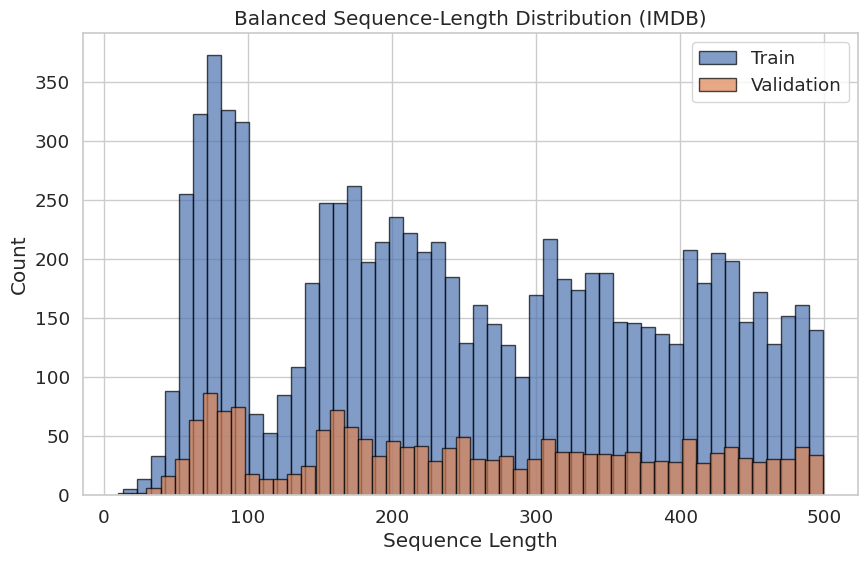

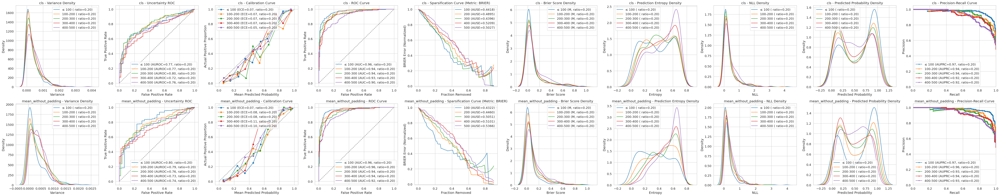

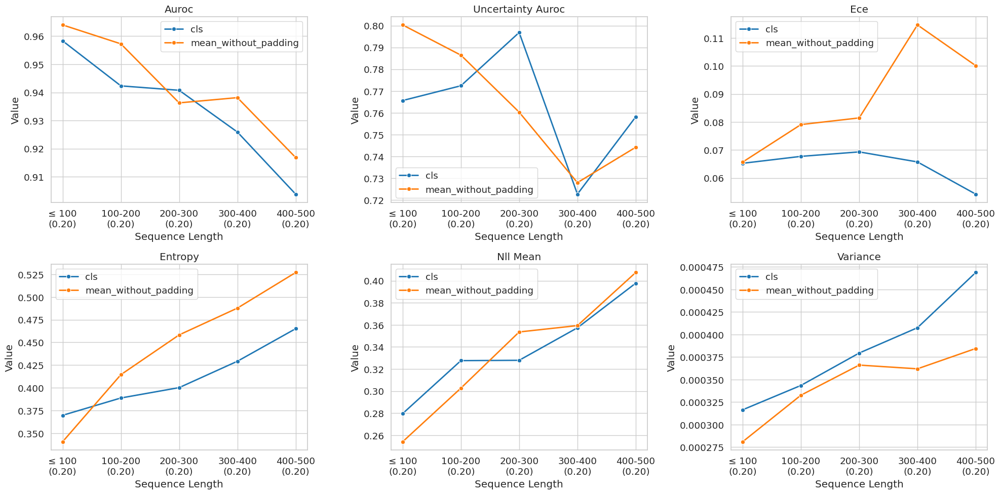

In [14]:
imdb_data,imdb_y =imdb_processing()


## RCT

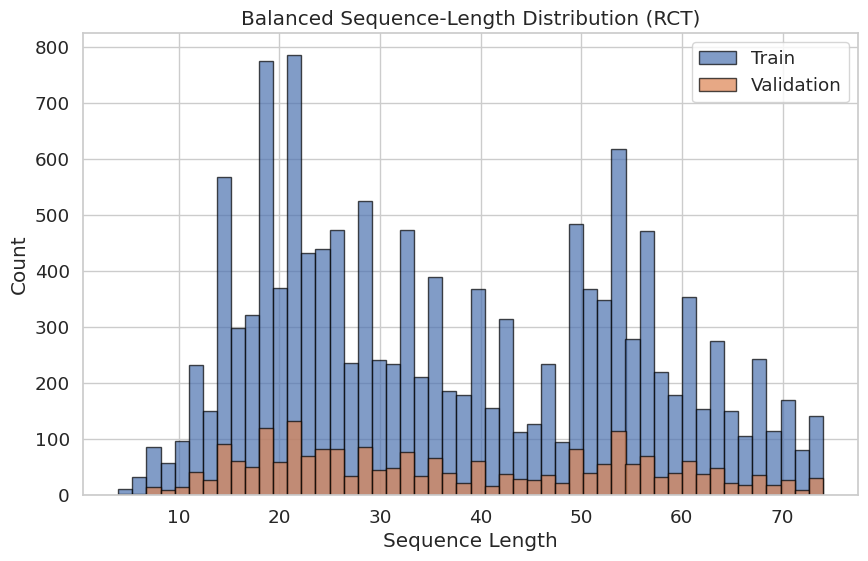

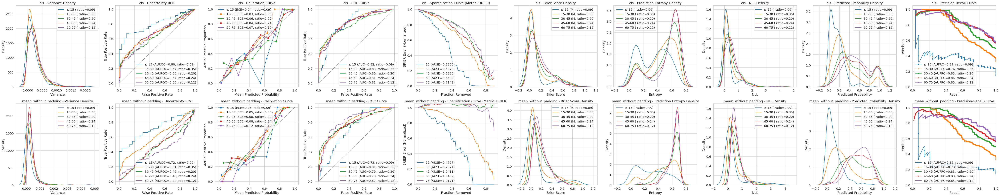

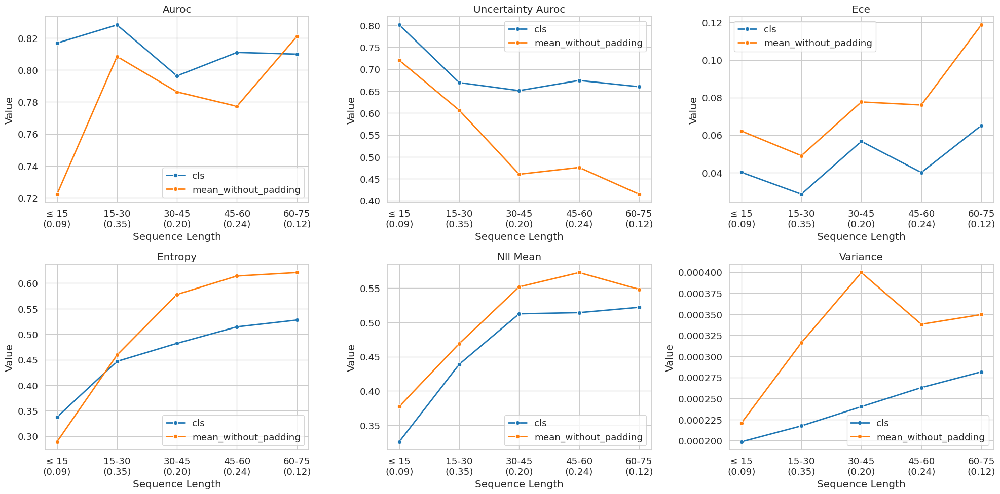

In [15]:
rct_data,rct_y   =rct_processing()


## Yelp

Token indices sequence length is longer than the specified maximum sequence length for this model (1019 > 512). Running this sequence through the model will result in indexing errors
Token indices sequence length is longer than the specified maximum sequence length for this model (565 > 512). Running this sequence through the model will result in indexing errors


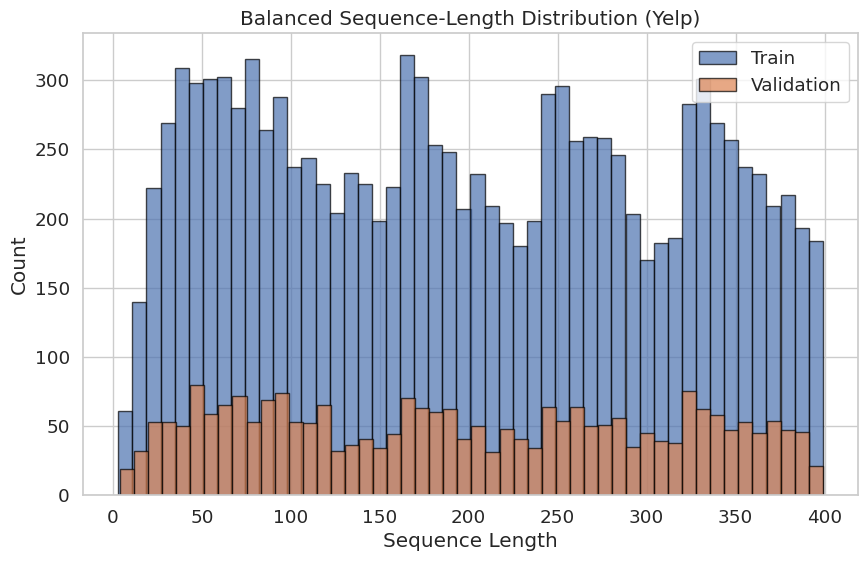

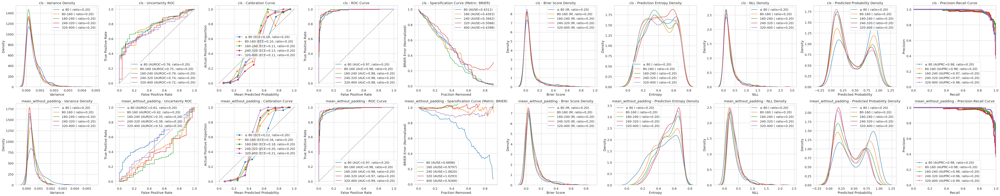

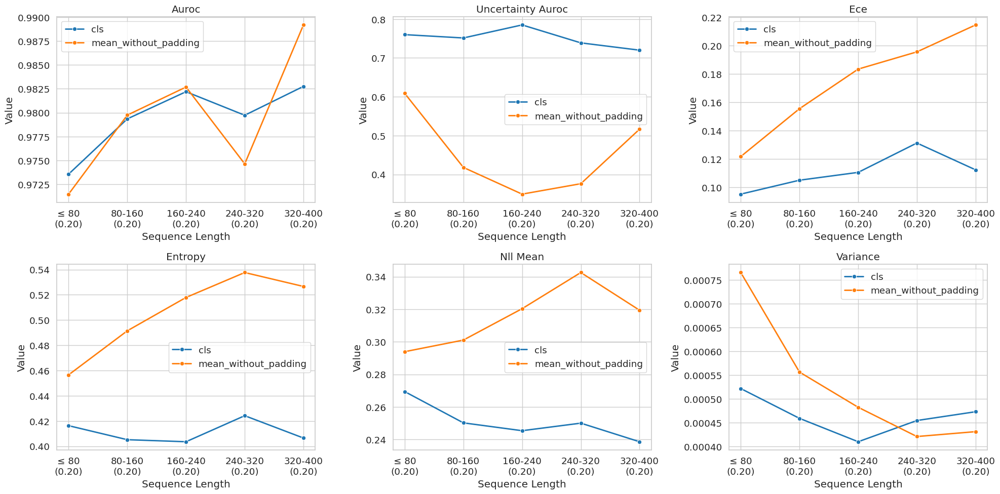

In [22]:
yelp_data,yelp_y=yelp_processing()


## MIMIC III

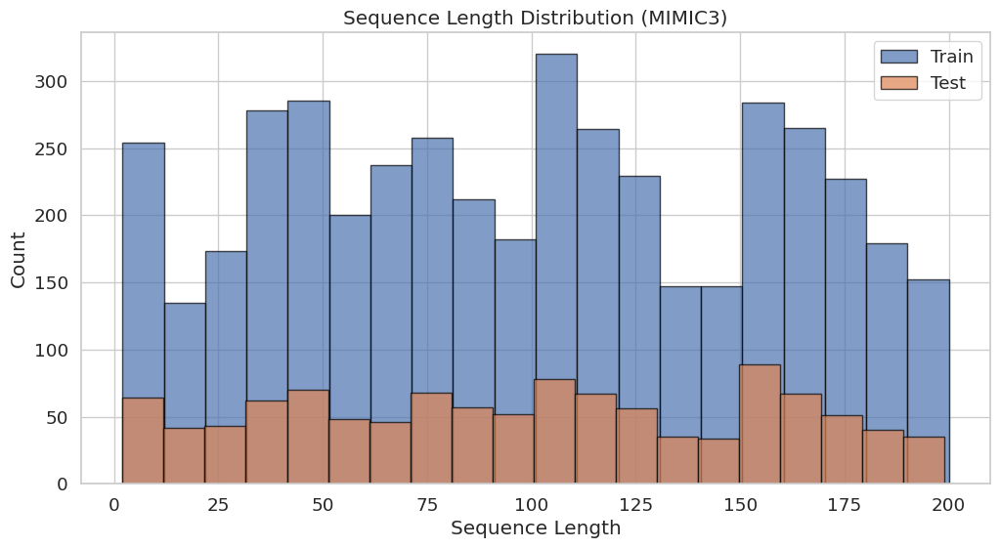

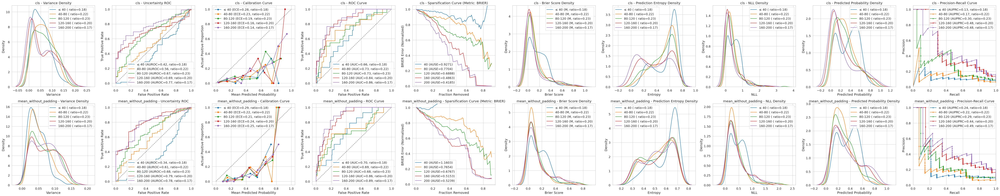

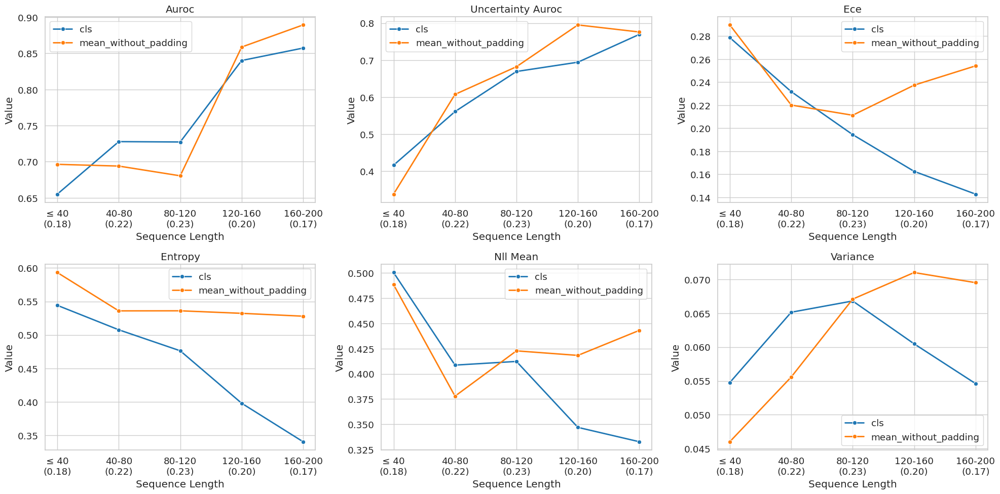

In [19]:
mimic3_data,mimic3_y=mimic3_processing()


## Wafer

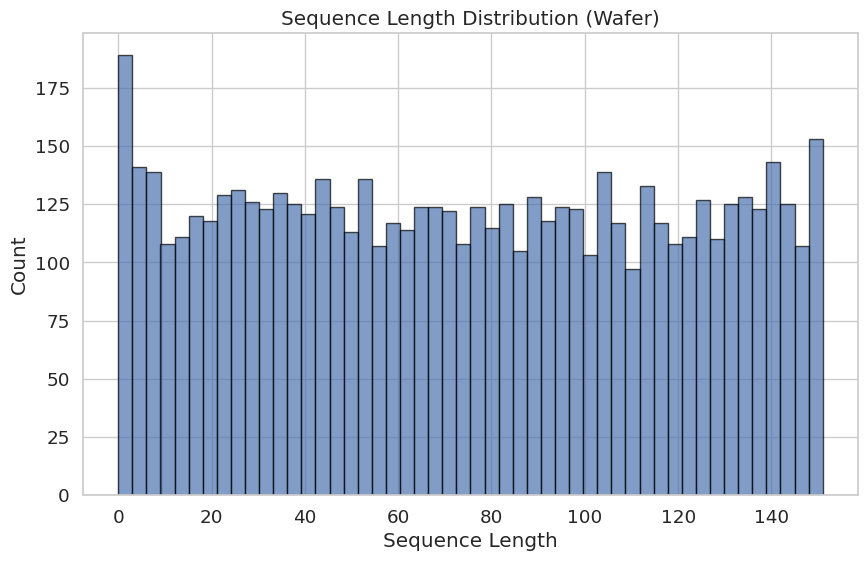

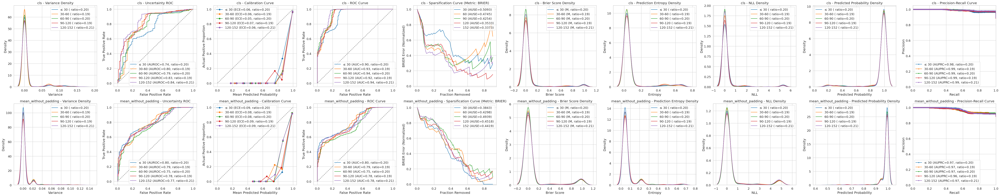

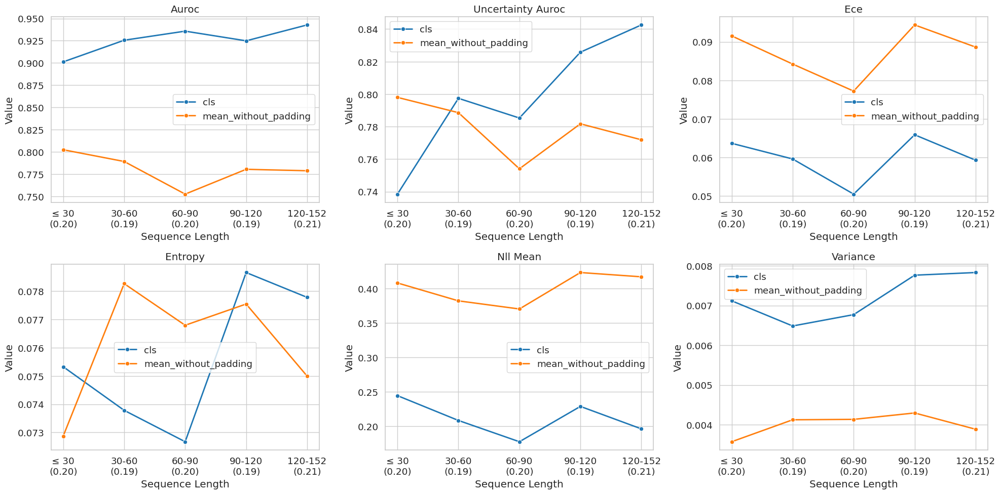

In [23]:
wafer_data,wafer_y=wafer_processing()


## ECG

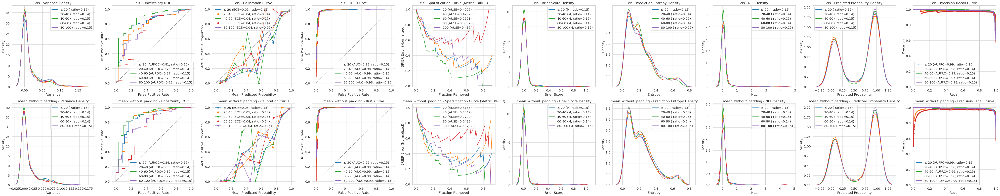

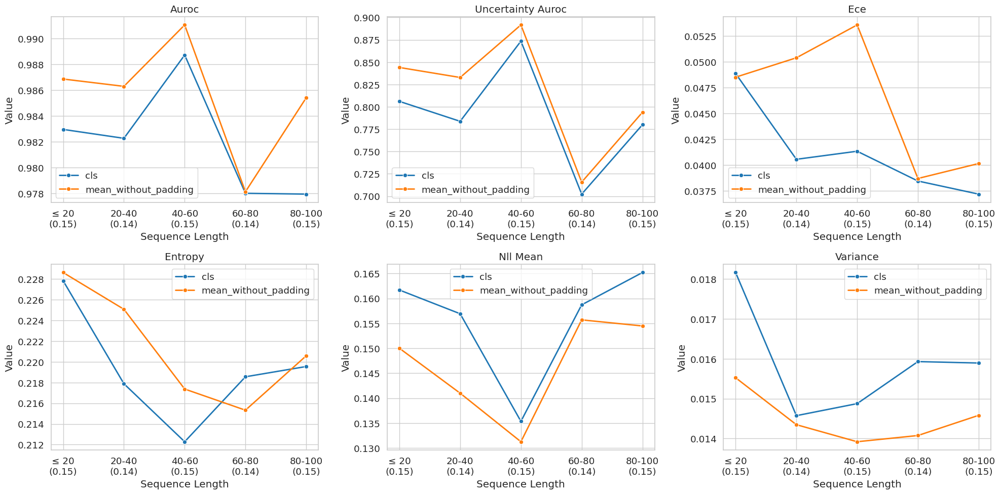

NameError: name 'y_val_int2' is not defined

In [21]:
ecg_data,ecg_y=ecg_processing()


## Viusal

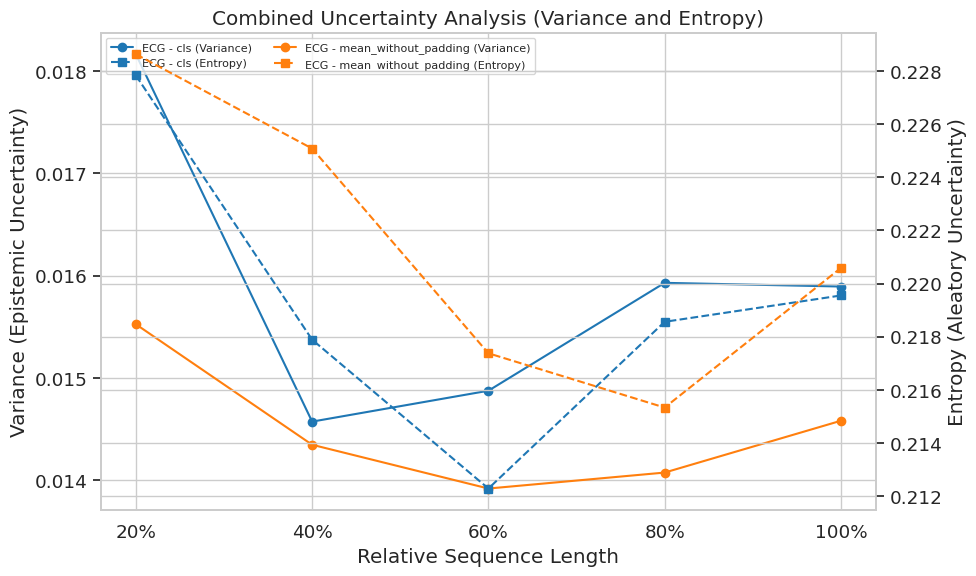

In [8]:
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import re
def parse_truncation(trunc_str):
    s = trunc_str.strip()
    if s.startswith("≤"):
        try:
            return float(s.replace("≤", "").strip())
        except:
            return np.nan
    else:
        parts = s.split("-")
        if len(parts) == 2:
            try:
                return float(parts[1].strip())
            except:
                return np.nan
        else:
            try:
                return float(s)
            except:
                return np.nan
def plot_combined_uncertainty(df_dict, dataset_max, selected_datasets=None):
    if selected_datasets is None:
        selected_datasets = list(df_dict.keys())
    sample_ds = selected_datasets[0]
    df_sample = df_dict[sample_ds]
    pooling_methods = df_sample['pooling'].unique()
    palette = sns.color_palette("tab10", n_colors=len(pooling_methods))
    pooling_colors = dict(zip(pooling_methods, palette))
    x_ticks = [0.2, 0.4, 0.6, 0.8, 1.0]
    x_labels = ["20%", "40%", "60%", "80%", "100%"]
    fig, ax1 = plt.subplots(figsize=(10, 6))
    ax2 = ax1.twinx()
    legend_lines = []
    legend_labels = []
    for ds in selected_datasets:
        df = df_dict[ds].copy()
        max_len = dataset_max[ds]
        df['rel_pct'] = df['truncation'].apply(lambda s: parse_truncation(s) / max_len)
        for pooling in pooling_methods:
            df_pool = df[df['pooling'] == pooling].sort_values(by='rel_pct')
            x_vals = df_pool['rel_pct'].values
            var_vals = df_pool['var_mean'].values
            ent_vals = df_pool['entropy_mean'].values
            if (len(x_vals) != len(x_ticks)) or (not np.allclose(x_vals, x_ticks, atol=0.05)):
                var_interp = np.interp(x_ticks, x_vals, var_vals)
                ent_interp = np.interp(x_ticks, x_vals, ent_vals)
            else:
                var_interp = var_vals
                ent_interp = ent_vals
            line1, = ax1.plot(x_ticks, var_interp, linestyle='-', marker='o',
                              color=pooling_colors[pooling],
                              label=f"{ds} - {pooling} (Variance)")
            line2, = ax2.plot(x_ticks, ent_interp, linestyle='--', marker='s',
                              color=pooling_colors[pooling],
                              label=f"{ds} - {pooling} (Entropy)")
            legend_lines.extend([line1, line2])
            legend_labels.extend([f"{ds} - {pooling} (Variance)", f"{ds} - {pooling} (Entropy)"])
    ax1.set_xlabel("Relative Sequence Length")
    ax1.set_ylabel("Variance (Epistemic Uncertainty)")
    ax2.set_ylabel("Entropy (Aleatory Uncertainty)")
    ax1.set_xticks(x_ticks)
    ax1.set_xticklabels(x_labels)
    ax1.grid(True)
    ax1.legend(legend_lines, legend_labels, loc="upper left", fontsize=8, ncol=2)
    plt.title("Combined Uncertainty Analysis (Variance and Entropy)")
    plt.tight_layout()
    plt.show()
df_dict = {
    "IMDB": imdb_data,
    "RCT": rct_data,
    "Yelp": yelp_data,
    "MIMIC3": mimic3_data,
    "Wafer": wafer_data,
    "ECG": ecg_data
}
dataset_max = {
    "IMDB": 500,
    "RCT": 75,
    "Yelp": 400,
    "MIMIC3": 200,
    "Wafer": 75,
    "ECG": 100
}
plot_combined_uncertainty(df_dict, dataset_max, selected_datasets=[
                                                                    "ECG"
])


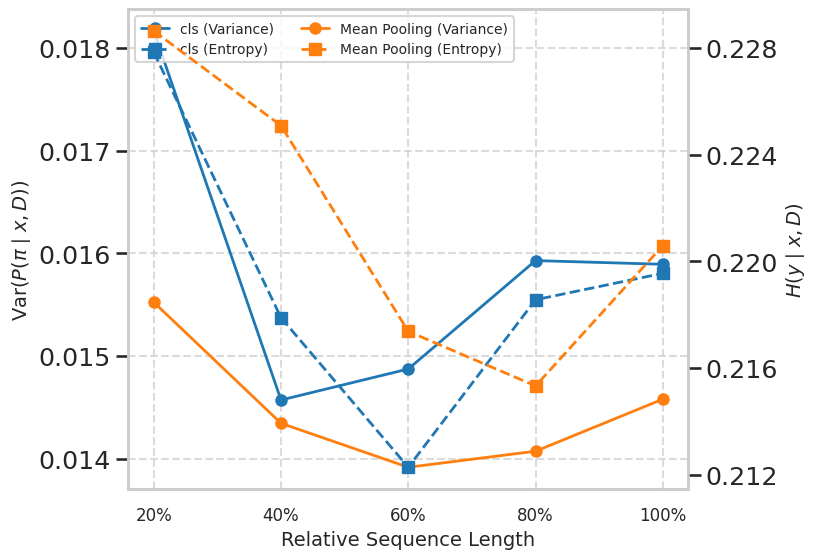

In [11]:
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import re
from matplotlib.ticker import MaxNLocator
sns.set(style="whitegrid", context="talk", font_scale=1.1)
def parse_truncation(trunc_str):
    s = trunc_str.strip()
    if s.startswith("≤"):
        try:
            return float(s.replace("≤", "").strip())
        except:
            return np.nan
    else:
        parts = s.split("-")
        if len(parts) == 2:
            try:
                return float(parts[1].strip())
            except:
                return np.nan
        else:
            try:
                return float(s)
            except:
                return np.nan
def plot_combined_uncertainty(df_dict, dataset_max, selected_datasets=None, save_path=None):
    if selected_datasets is None:
        selected_datasets = list(df_dict.keys())
    sample_ds = selected_datasets[0]
    df_sample = df_dict[sample_ds]
    pooling_methods = sorted(df_sample['pooling'].unique())
    palette = sns.color_palette("tab10", n_colors=len(pooling_methods))
    pooling_colors = dict(zip(pooling_methods, palette))
    x_ticks = [0.2, 0.4, 0.6, 0.8, 1.0]
    x_labels = ["20%", "40%", "60%", "80%", "100%"]
    fig, ax1 = plt.subplots(figsize=(8, 6))
    ax2 = ax1.twinx()
    legend_lines = []
    legend_labels = []
    for ds in selected_datasets:
        df = df_dict[ds].copy()
        max_len = dataset_max[ds]
        df['rel_pct'] = df['truncation'].apply(lambda s: parse_truncation(s) / max_len)
        for pooling in pooling_methods:
            display_pooling = "Mean Pooling" if pooling == "mean_without_padding" else pooling
            df_pool = df[df['pooling'] == pooling].sort_values(by='rel_pct')
            x_vals = df_pool['rel_pct'].values
            var_vals = df_pool['var_mean'].values
            ent_vals = df_pool['entropy_mean'].values
            if (len(x_vals) != len(x_ticks)) or (not np.allclose(x_vals, x_ticks, atol=0.05)):
                var_interp = np.interp(x_ticks, x_vals, var_vals)
                ent_interp = np.interp(x_ticks, x_vals, ent_vals)
            else:
                var_interp = var_vals
                ent_interp = ent_vals
            line1, = ax1.plot(x_ticks, var_interp, linestyle='-', marker='o',
                              markersize=8, linewidth=2,
                              color=pooling_colors[pooling],
                              label=f"{display_pooling} (Variance)")
            line2, = ax2.plot(x_ticks, ent_interp, linestyle='--', marker='s',
                              markersize=8, linewidth=2,
                              color=pooling_colors[pooling],
                              label=f"{display_pooling} (Entropy)")
            legend_lines.extend([line1, line2])
            legend_labels.extend([f"{display_pooling} (Variance)", f"{display_pooling} (Entropy)"])
    ax1.set_xlabel("Relative Sequence Length", fontsize=14)
    ax1.set_ylabel(r'$\mathrm{Var}(P(\pi \mid x, D))$', fontsize=14, weight='bold')
    ax2.set_ylabel(r'$H(y \mid x, D)$', fontsize=14, weight='bold')
    ax1.set_xticks(x_ticks)
    ax1.set_xticklabels(x_labels, fontsize=12)
    ax1.yaxis.set_major_locator(MaxNLocator(5))
    ax2.yaxis.set_major_locator(MaxNLocator(5))
    ax1.grid(True, linestyle='--', alpha=0.7)
    ax2.grid(False)
    ax1.legend(legend_lines, legend_labels, loc="upper left", fontsize=10, ncol=2, frameon=True)
    plt.subplots_adjust(left=0.15, right=0.85, top=0.95, bottom=0.15)
    if save_path is not None:
        fig.savefig(save_path, dpi=300, bbox_inches='tight')
    plt.show()
df_dict = {
    "IMDB": imdb_data,
    "RCT": rct_data,
    "Yelp": yelp_data,
    "MIMIC3": mimic3_data,
    "Wafer": wafer_data,
    "ECG": ecg_data
}
dataset_max = {
    "IMDB": 500,
    "RCT": 75,
    "Yelp": 400,
    "MIMIC3": 200,
    "Wafer": 75,
    "ECG": 100
}
plot_combined_uncertainty(df_dict, dataset_max, selected_datasets=["ECG"], save_path="combined_uncertainty_IMDB.png")


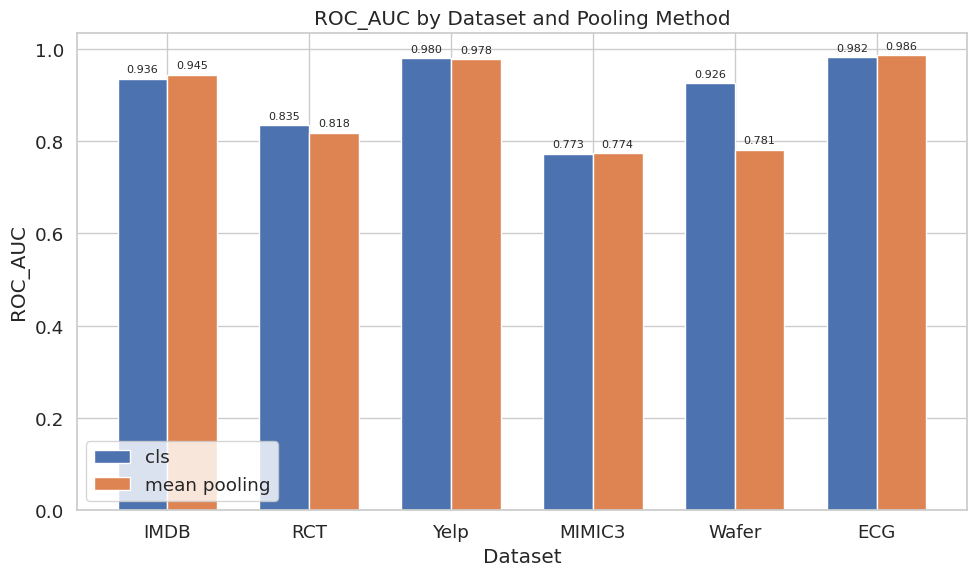

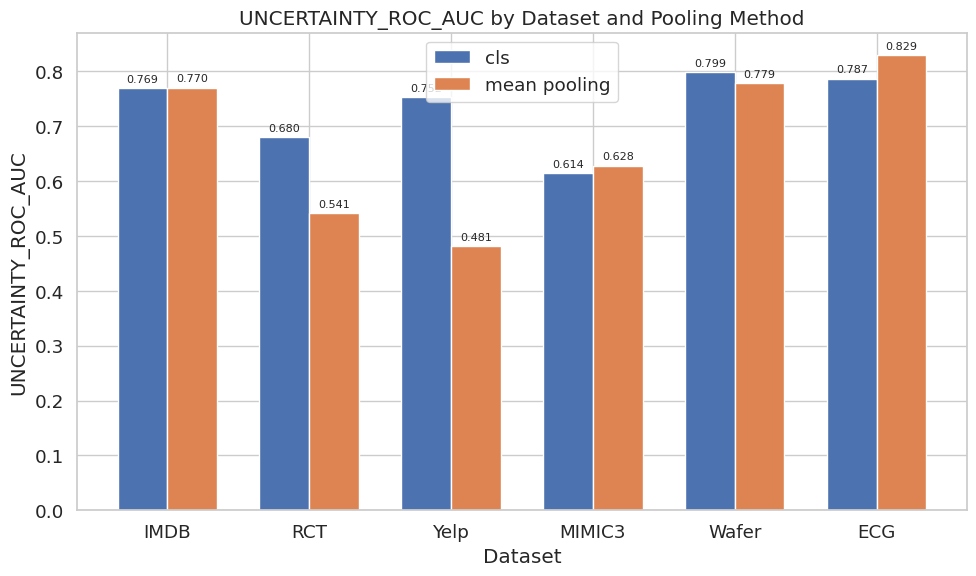

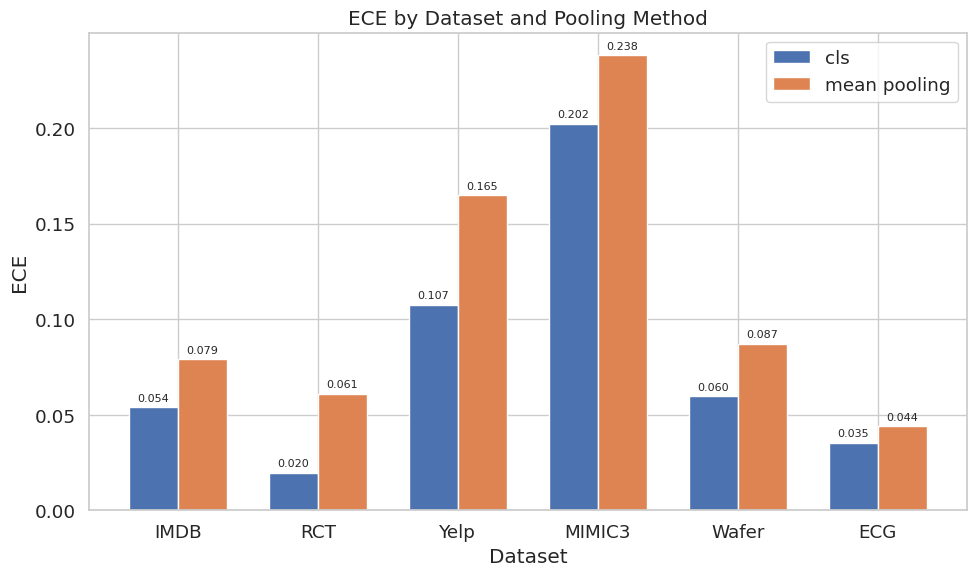

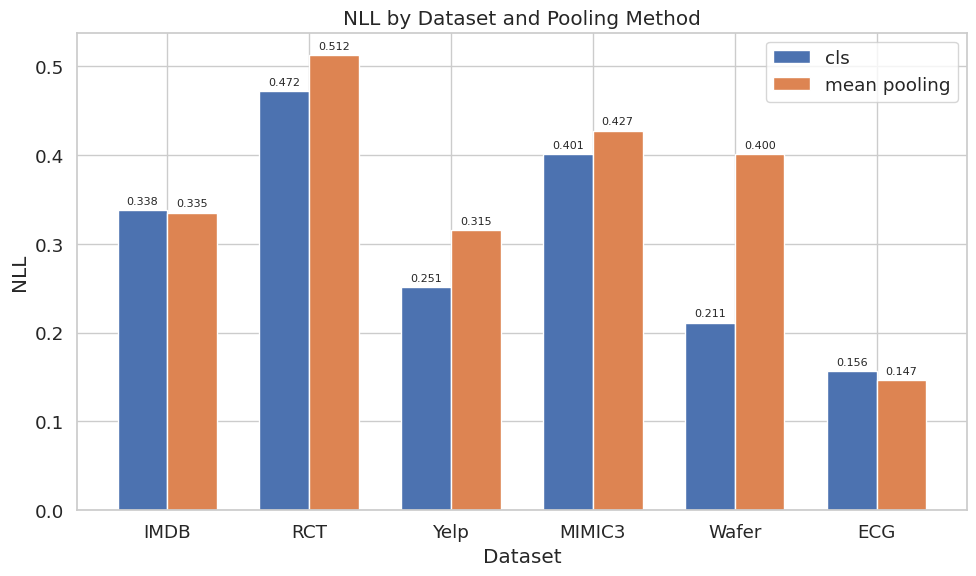

In [9]:
import pickle
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import roc_auc_score
from sklearn.metrics import roc_curve
import math
def compute_overall_metrics(prob_df, y):
    y = np.array(y)
    prob_df = np.array(prob_df)
    pred = np.mean(prob_df, axis=1)
    var = np.var(prob_df, axis=1)
    roc_auc = roc_auc_score(y, pred)
    correctness = (y == (pred > 0.5))
    fpr, tpr, _ = roc_curve(correctness, -var)
    uncertainty_auc = roc_auc_score(correctness, -var)
    def compute_ece(y_true, y_prob, n_bins=10):
        y_true, y_prob = np.array(y_true), np.array(y_prob)
        bin_edges = np.linspace(0, 1, n_bins + 1)
        ece_val = 0.0
        for i in range(n_bins):
            bin_lower = bin_edges[i]
            bin_upper = bin_edges[i + 1]
            bin_mask = (y_prob > bin_lower) & (y_prob <= bin_upper)
            if np.sum(bin_mask) > 0:
                bin_accuracy = np.mean(y_true[bin_mask] == 1)
                bin_confidence = np.mean(y_prob[bin_mask])
                ece_val += np.abs(bin_accuracy - bin_confidence) * (np.sum(bin_mask) / len(y_true))
        return ece_val
    ece_val = compute_ece(y, pred, n_bins=10)
    epsilon = 1e-10
    nll_val = np.mean(- y * np.log(pred + epsilon) - (1 - y) * np.log(1 - pred + epsilon))
    return {
        "roc_auc": roc_auc,
        "uncertainty_roc_auc": uncertainty_auc,
        "ece": ece_val,
        "nll": nll_val
    }
def compute_overall_metrics_for_dataset(res_set, y):
    poolings = ["cls", "mean_without_padding"]
    results = {}
    for i, pooling in enumerate(poolings):
        results[pooling] = compute_overall_metrics(res_set[i], y)
    return results
def plot_metric_bar_chart(results_dict, metric_name, selected_datasets=None):
    if selected_datasets is None:
        selected_datasets = list(results_dict.keys())
    poolings = ["cls", "mean_without_padding"]
    x = np.arange(len(selected_datasets))
    width = 0.35
    fig, ax = plt.subplots(figsize=(10, 6))
    values_cls = []
    values_mean = []
    for ds in selected_datasets:
        metrics = results_dict[ds]
        values_cls.append(metrics["cls"][metric_name])
        values_mean.append(metrics["mean_without_padding"][metric_name])
    rects1 = ax.bar(x - width/2, values_cls, width, label="cls", color="C0")
    rects2 = ax.bar(x + width/2, values_mean, width, label="mean pooling", color="C1")
    ax.set_xlabel("Dataset")
    ax.set_ylabel(metric_name.upper())
    ax.set_xticks(x)
    ax.set_xticklabels(selected_datasets)
    ax.set_title(f"{metric_name.upper()} by Dataset and Pooling Method")
    ax.legend()
    for rect in rects1 + rects2:
        height = rect.get_height()
        ax.annotate(f"{height:.3f}",
                    xy=(rect.get_x() + rect.get_width()/2, height),
                    xytext=(0, 3), textcoords="offset points",
                    ha="center", va="bottom", fontsize=8)
    plt.tight_layout()
    plt.show()
results_dict = {}
try:
    with open("IMDB/model/ntrain_cls_sq500_imdb_bal.pkl", "rb") as f:
        imdb_cls = pickle.load(f)
    with open("IMDB/model/ntrain_mean_without_padding_sq500_imdb_bal.pkl", "rb") as f:
        imdb_mean = pickle.load(f)
    imdb_res_set = [imdb_cls, imdb_mean]
    results_dict["IMDB"] = compute_overall_metrics_for_dataset(imdb_res_set, imdb_y)
except Exception as e:
    print("IMDB 数据加载错误：", e)
try:
    with open("model/ntrain_cls_sq75_rct_bal.pkl", "rb") as f:
        rct_cls = pickle.load(f)
    with open("model/ntrain_mean_without_padding_sq75_rct_bal.pkl", "rb") as f:
        rct_mean = pickle.load(f)
    rct_res_set = [rct_cls, rct_mean]
    results_dict["RCT"] = compute_overall_metrics_for_dataset(rct_res_set, rct_y)
except Exception as e:
    print("RCT 数据加载错误：", e)
try:
    with open("Yelp/model/ntrain_cls_sq400_yelp_bal.pkl", "rb") as f:
        yelp_cls = pickle.load(f)
    with open("Yelp/model/ntrain_mean_without_padding_sq400_yelp_bal.pkl", "rb") as f:
        yelp_mean = pickle.load(f)
    yelp_res_set = [yelp_cls, yelp_mean]
    results_dict["Yelp"] = compute_overall_metrics_for_dataset(yelp_res_set, yelp_y)
except Exception as e:
    print("Yelp 数据加载错误：", e)
try:
    with open("mimic3/model_result/ensemble_cls_sql200_bal1.pkl", "rb") as f:
        mimic3_cls = pickle.load(f)
    with open("mimic3/model_result/ensemble_mean_without_padding_sql200_bal1.pkl", "rb") as f:
        mimic3_mean = pickle.load(f)
    mimic3_res_set = [mimic3_cls, mimic3_mean]
    results_dict["MIMIC3"] = compute_overall_metrics_for_dataset(mimic3_res_set, mimic3_y)
except Exception as e:
    print("MIMIC3 数据加载错误：", e)
try:
    with open("Time_series/results/Wafer_ensemble_cls.pkl", "rb") as f:
        wafer_cls = pickle.load(f)
    with open("Time_series/results/Wafer_ensemble_mean_without_padding.pkl", "rb") as f:
        wafer_mean = pickle.load(f)
    wafer_res_set = [pd.DataFrame(wafer_cls).T, pd.DataFrame(wafer_mean).T]
    results_dict["Wafer"] = compute_overall_metrics_for_dataset(wafer_res_set, wafer_y.tolist())
except Exception as e:
    print("Wafer 数据加载错误：", e)
try:
    with open("Time_series/results/ECG200_ensemble_cls.pkl", "rb") as f:
        ecg_cls = pickle.load(f)
    with open("Time_series/results/ECG200_ensemble_mean_without_padding.pkl", "rb") as f:
        ecg_mean = pickle.load(f)
    ecg_res_set = [pd.DataFrame(ecg_cls).T, pd.DataFrame(ecg_mean).T]
    results_dict["ECG"] = compute_overall_metrics_for_dataset(ecg_res_set, ecg_y.tolist())
except Exception as e:
    print("ECG 数据加载错误：", e)
plot_metric_bar_chart(results_dict, metric_name="roc_auc",
                      selected_datasets=["IMDB", "RCT", "Yelp", "MIMIC3", "Wafer", "ECG"])
plot_metric_bar_chart(results_dict, metric_name="uncertainty_roc_auc")
plot_metric_bar_chart(results_dict, metric_name="ece")
plot_metric_bar_chart(results_dict, metric_name="nll")


In [10]:
import pandas as pd
nlp_datasets = ["IMDB", "RCT", "Yelp"]
ehr_datasets = ["MIMIC3", "Wafer", "ECG"]
rows = []
for ds, metrics in results_dict.items():
    if ds in nlp_datasets:
        category = "NLP"
    elif ds in ehr_datasets:
        category = "Time Series"
    else:
        category = "Other"
    row = {
        "Dataset": ds,
        "Category": category,
        "ROC AUC (cls)": metrics["cls"].get("roc_auc", None),
        "ROC AUC (mean)": metrics["mean_without_padding"].get("roc_auc", None),
        "Uncertainty ROC AUC (cls)": metrics["cls"].get("uncertainty_roc_auc", None),
        "Uncertainty ROC AUC (mean)": metrics["mean_without_padding"].get("uncertainty_roc_auc", None),
        "ECE (cls)": metrics["cls"].get("ece", None),
        "ECE (mean)": metrics["mean_without_padding"].get("ece", None),
        "NLL (cls)": metrics["cls"].get("nll", None),
        "NLL (mean)": metrics["mean_without_padding"].get("nll", None)
    }
    rows.append(row)
df_summary = pd.DataFrame(rows)
df_summary = df_summary.sort_values(by=["Category", "Dataset"])
def highlight_metrics(row):
    style = pd.Series("", index=row.index)
    for metric in ["ROC AUC", "Uncertainty ROC AUC"]:
        col_cls = f"{metric} (cls)"
        col_mean = f"{metric} (mean)"
        if pd.notnull(row[col_cls]) and pd.notnull(row[col_mean]):
            if row[col_cls] >= row[col_mean]:
                style[col_cls] = "font-weight: bold"
            else:
                style[col_mean] = "font-weight: bold"
    for metric in ["ECE", "NLL"]:
        col_cls = f"{metric} (cls)"
        col_mean = f"{metric} (mean)"
        if pd.notnull(row[col_cls]) and pd.notnull(row[col_mean]):
            if row[col_cls] <= row[col_mean]:
                style[col_cls] = "font-weight: bold"
            else:
                style[col_mean] = "font-weight: bold"
    return style
styled_df = df_summary.style.apply(highlight_metrics, axis=1)
display(styled_df)


,Dataset,Category,ROC AUC (cls),ROC AUC (mean),Uncertainty ROC AUC (cls),Uncertainty ROC AUC (mean),ECE (cls),ECE (mean),NLL (cls),NLL (mean)
0,IMDB,NLP,0.935866,0.944619,0.768863,0.770012,0.053851,0.078921,0.337670,0.335082
1,RCT,NLP,0.835088,0.818288,0.679640,0.541010,0.019580,0.061017,0.471911,0.512112
2,Yelp,NLP,0.979508,0.978368,0.752353,0.481370,0.107483,0.164709,0.250761,0.315377
5,ECG,Time Series,0.982333,0.986344,0.786781,0.829304,0.035267,0.043995,0.156369,0.146647
3,MIMIC3,Time Series,0.772850,0.773777,0.614211,0.628321,0.202275,0.238082,0.401037,0.427394
4,Wafer,Time Series,0.925654,0.781377,0.798861,0.778941,0.059705,0.087141,0.211042,0.400436
